
=== Evaluating Q-Learning for pGen = 0.1 ===

=== Q-Learning (pGen=0.1) Policy Training Run 1 ===
SIMULATION (Fairness-aware Q-values, stochastic success)
SIMULATION (Fairness-aware Q-values, stochastic success)
SIMULATION (Fairness-aware Q-values, stochastic success)
SIMULATION (Fairness-aware Q-values, stochastic success)
SIMULATION (Fairness-aware Q-values, stochastic success)

=== Q-Learning (pGen=0.1) Policy Training Run 2 ===
SIMULATION (Fairness-aware Q-values, stochastic success)
SIMULATION (Fairness-aware Q-values, stochastic success)
SIMULATION (Fairness-aware Q-values, stochastic success)
SIMULATION (Fairness-aware Q-values, stochastic success)
SIMULATION (Fairness-aware Q-values, stochastic success)

=== Q-Learning (pGen=0.1) Policy Training Run 3 ===
SIMULATION (Fairness-aware Q-values, stochastic success)
SIMULATION (Fairness-aware Q-values, stochastic success)
SIMULATION (Fairness-aware Q-values, stochastic success)
SIMULATION (Fairness-aware Q-values, stochastic succes

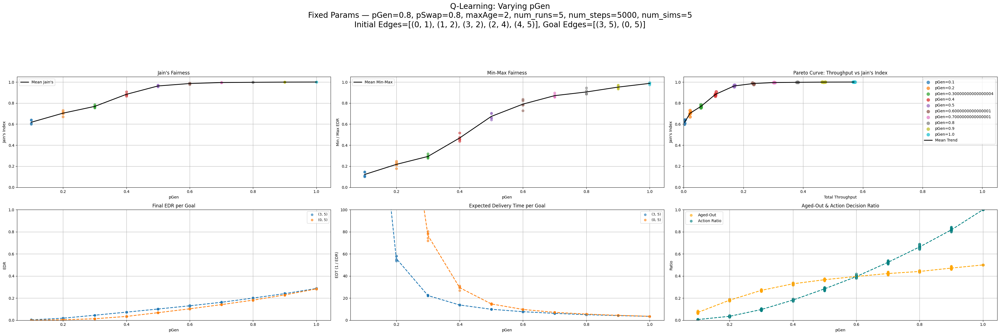

{0.1: {'edrs': {(3, 5): [np.float64(0.003580534083703774),
    np.float64(0.003342513093227668),
    np.float64(0.003118233459510422),
    np.float64(0.0027212719003898225),
    np.float64(0.0026845334012520626)],
   (0, 5): [np.float64(0.000540057828227969),
    np.float64(0.0004954441130916515),
    np.float64(0.00035690972109053926),
    np.float64(0.00026768229081790447),
    np.float64(0.00026768229081790447)]},
  'edts': {(3, 5): [np.float64(279.28716324184546),
    np.float64(299.17519553600505),
    np.float64(320.69336887409185),
    np.float64(367.4738731980507),
    np.float64(372.50282470143827)],
   (0, 5): [np.float64(1851.619273973654),
    np.float64(2018.3503851849443),
    np.float64(2801.7504803169213),
    np.float64(3735.632419389477),
    np.float64(3735.632419389477)]},
  'jains': [np.float64(0.6407772925459121),
   np.float64(0.6385081603391972),
   np.float64(0.6104998358507112),
   np.float64(0.600281279805849),
   np.float64(0.600281279805849)],
  'minmax': [

In [2]:
from collections import defaultdict
import matplotlib.pyplot as plt
import numpy as np
import math
import random
from itertools import product, combinations
from utility import *
import math

def getReward(
    achieved_goals, 
    goal_success_counts, 
    total_timesteps, 
    p_swap, 
    punish_failed=True,
    epsilon=1e-3,
):
    reward = 0.0

    if achieved_goals is None:
        return -0.1  # Slight negative reward for doing nothing

    for goal_edge, success in achieved_goals:
        hops = max(1, abs(goal_edge[1] - goal_edge[0]))
        success_prob = p_swap ** hops
        edr = goal_success_counts[goal_edge] / max(1, total_timesteps) + epsilon

        expected_reward = (success_prob / edr)

        if success:
            reward += expected_reward
            goal_success_counts[goal_edge] += 1
        else:
            if punish_failed:
                # Explicit penalty for failure
                penalty = -expected_reward * 0.95  # Punish failures
                reward += penalty

    return reward


def generateAllSwappingOutcomes(state, goalEdges, pSwap):
    """
    Generate all possible outcomes from swapping operations or doing nothing.
    Can attempt multiple non-overlapping swaps simultaneously.
    """
    def find_path(current, target, visited):
        if current == target:
            return [current]
        visited.add(current)
        for next_node in graph.get(current, []):
            if next_node not in visited:
                path = find_path(next_node, target, visited)
                if path:
                    return [current] + path
        return None

    # First find all possible individual swap attempts
    swap_attempts = []
    entangled_edges = [(edge, age) for edge, age in state if age > 0]
    
    # Create graph once for all path finding
    graph = {}
    for (edge, _) in entangled_edges:
        if edge[0] not in graph: graph[edge[0]] = []
        if edge[1] not in graph: graph[edge[1]] = []
        graph[edge[0]].append(edge[1])
        graph[edge[1]].append(edge[0])
    
    # Find all possible paths for each goal
    for goal_edge in goalEdges:
        start, end = goal_edge
        path = find_path(start, end, set())
        
        if path and len(path) > 1:
            path_edges = list(zip(path[:-1], path[1:]))
            used_edges = []
            for p_edge in path_edges:
                for e, age in entangled_edges:
                    if (e[0] == p_edge[0] and e[1] == p_edge[1]) or \
                       (e[0] == p_edge[1] and e[1] == p_edge[0]):
                        used_edges.append((e, age))
            
            swap_attempts.append({
                'goal': goal_edge,
                'used_edges': used_edges,
                'num_swaps': len(path_edges) - 1
            })
    
    outcomes = []
    
    # Case 1: Do nothing
    outcomes.append((state, 1.0, None))
    
    # Case 2: Try all possible combinations of non-overlapping swaps
    for r in range(1, len(swap_attempts) + 1):
        for attempt_combo in combinations(swap_attempts, r):
            # Check if attempts are compatible (don't share edges)
            all_used_edges = set()
            edge_overlap = False
            for attempt in attempt_combo:
                attempt_edges = set(e for e, _ in attempt['used_edges'])
                if any(e in all_used_edges for e in attempt_edges):
                    edge_overlap = True
                    break
                all_used_edges.update(attempt_edges)
            
            if edge_overlap:
                continue
                
            # Generate all success/failure combinations for this set of attempts
            for success_pattern in product([True, False], repeat=len(attempt_combo)):
                new_state = []
                total_prob = 1.0
                achieved_goals = []
                
                # Calculate probability and track achieved goals
                for attempt, succeeded in zip(attempt_combo, success_pattern):
                    prob = pSwap ** attempt['num_swaps'] if succeeded else \
                          (1 - pSwap ** attempt['num_swaps'])
                    total_prob *= prob
                    if succeeded:
                        achieved_goals.append((attempt['goal'], True))
                    else:
                        achieved_goals.append((attempt['goal'], False))
                
                # Create new state
                for edge, age in state:
                    if any(edge == e for attempt in attempt_combo 
                          for e, _ in attempt['used_edges']):
                        new_state.append((edge, -1))  # Used edges become unentangled
                    else:
                        new_state.append((edge, age))  # Other edges remain unchanged
                
                new_state = tuple(sorted(new_state))
                outcomes.append((new_state, total_prob, achieved_goals))
    
    return outcomes

def plot_q_learning_results(agent):
    fig, ((ax1, ax2), (ax3, ax4), (ax5, ax6)) = plt.subplots(3, 2, figsize=(15, 18))

    for goal, edr_values in agent.edr_history.items():
        ax1.plot(range(len(edr_values)), edr_values, label=f'Goal {goal}')
    ax1.set_title('EDR Evolution (Last Episode)')
    ax1.set_xlabel('Step')
    ax1.set_ylabel('EDR')
    ax1.grid(True)
    ax1.legend()
    ax1.set_ylim(0, 1)

    ax2.plot(agent.reward_history, alpha=0.3, label='Raw')
    if len(agent.episode_avg_rewards) > 0:
        ax2.plot(range(99, len(agent.episode_avg_rewards) + 99), agent.episode_avg_rewards, label='100-episode moving avg')
    ax2.set_title('Training Progress (Reward)')
    ax2.set_xlabel('Episode')
    ax2.set_ylabel('Total Reward')
    ax2.grid(True)
    ax2.legend()

    ax3.plot(agent.episode_avg_q_values)
    ax3.set_title('Q-value Convergence')
    ax3.set_xlabel('Episode')
    ax3.set_ylabel('Average Q-value')
    ax3.grid(True)

    for goal, edr_values in agent.episode_edrs.items():
        ax4.plot(range(len(edr_values)), edr_values, label=f'Goal {goal}')
    ax4.set_title('EDR Evolution Across Episodes')
    ax4.set_xlabel('Episode')
    ax4.set_ylabel('EDR')
    ax4.grid(True)
    ax4.legend()
    ax4.set_ylim(0, 1)

    ax5.plot(agent.fairness_history['jains_index'], label="Jain's Index")
    ax5.set_title("Jain's Fairness Index Evolution")
    ax5.set_xlabel('Episode')
    ax5.set_ylabel('Fairness Index')
    ax5.grid(True)
    ax5.set_ylim(0, 1)

    ax6.plot(agent.fairness_history['min_max_ratio'], label='Min-Max Ratio')
    ax6.plot(agent.fairness_history['cv'], label='CV')
    ax6.set_title('Fairness Metrics Evolution')
    ax6.set_xlabel('Episode')
    ax6.set_ylabel('Metric Value')
    ax6.grid(True)
    ax6.legend()

    plt.tight_layout()
    plt.show()

def calculate_fairness_metrics(edrs):
    if not edrs:
        return 0, 0, 0

    values = list(edrs.values())
    numerator = sum(values) ** 2
    denominator = len(values) * sum(x * x for x in values)
    jains_index = numerator / denominator if denominator != 0 else 0
    min_val = min(values)
    max_val = max(values)
    min_max_ratio = min_val / max_val if max_val != 0 else 0
    mean = np.mean(values)
    std = np.std(values)
    cv = std / mean if mean != 0 else 0
    return jains_index, min_max_ratio, cv

def softmax_probs(q_values, temperature=1.0):
    max_q = max(q_values)
    exp_q = [math.exp((q - max_q) / temperature) for q in q_values]
    sum_exp_q = sum(exp_q)
    return [x / sum_exp_q for x in exp_q]

class QuantumNetworkQLearning:
    def __init__(self, edges, goalEdges, pSwap, pGen, maxAge, alpha, gamma, epsilon, softmax, temperature, temperature_decay):
        self.edges = edges
        self.goalEdges = goalEdges
        self.pSwap = pSwap
        self.pGen = pGen
        self.maxAge = maxAge
        self.softmax = softmax
        self.temperature = temperature
        self.temperature_decay = temperature_decay
        self.alpha = alpha
        self.gamma = gamma
        self.epsilon = epsilon

        self.Q = qTable()

        self.goal_success_counts = {goal: 0 for goal in goalEdges}
        self.edr_history = {goal: [] for goal in goalEdges}
        self.reward_history = []
        self.episode_avg_q_values = []
        self.episode_avg_rewards = []
        self.episode_edrs = {goal: [] for goal in goalEdges}
        self.fairness_history = {
            'jains_index': [],
            'min_max_ratio': [],
            'cv': []
        }

    def choose_action(self, state, training=True):
        possible_actions = getPossibleActions(state, self.goalEdges)

        q_scores = [
            (action, self.Q.get_q_value(state, action))
            for action in possible_actions
        ]

        if self.softmax and training:
            q_vals_only = [score for (_, score) in q_scores]
            probs = softmax_probs(q_vals_only, self.temperature)
            chosen_action = random.choices([a for a, _ in q_scores], weights=probs)[0]
        else:
            if training and random.random() < self.epsilon:
                chosen_action = random.choice(possible_actions)
            else:
                chosen_action = max(q_scores, key=lambda x: x[1])[0]

        return chosen_action



    def train(self, num_episodes=10, max_steps=1000, plot=False):
        window_size = 1000
        for episode in range(num_episodes):
            state = tuple((edge, -1) for edge in self.edges)
            episode_reward = 0
            total_timesteps = 1
            episode_q_values = []
            self.goal_success_counts = {goal: 0 for goal in self.goalEdges}
            episode_fairness_values = {'jains_index': [], 'min_max_ratio': [], 'cv': []}

            for step in range(max_steps):
                action = self.choose_action(state, training=True)

                next_state = performAction(action, list(state))
                next_state = ageEntanglements(next_state, self.maxAge)
                next_state = generateEntanglement(next_state, self.pGen)
                next_state = tuple(sorted(next_state))

                achieved_goals = None
                consumed_edges, goal_edge = action
                if goal_edge is not None and len(consumed_edges) > 0:
                    success_prob = self.pSwap ** (len(consumed_edges) - 1)
                    success = random.random() < success_prob
                    achieved_goals = [(goal_edge, success)]

                reward = getReward(
                    achieved_goals,
                    self.goal_success_counts, 
                    total_timesteps,
                    self.pSwap
                )

                episode_reward += reward

                old_q = self.Q.get_q_value(state, action)
                possible_next_actions = getPossibleActions(next_state, self.goalEdges)
                next_q = max(
                    [self.Q.get_q_value(next_state, a) for a in possible_next_actions], 
                    default=0.0
                )

                updated_q = old_q + self.alpha * (reward + self.gamma * next_q - old_q)
                self.Q.set_q_value(state, action, updated_q)

                episode_q_values.append(updated_q)

                if achieved_goals:
                    for goal, success in achieved_goals:
                        if success:
                            self.goal_success_counts[goal] += 1

                current_edrs = {goal: self.goal_success_counts[goal] / total_timesteps for goal in self.goalEdges}
                jains, minmax, cv = calculate_fairness_metrics(current_edrs)
                episode_fairness_values['jains_index'].append(jains)
                episode_fairness_values['min_max_ratio'].append(minmax)
                episode_fairness_values['cv'].append(cv)

                state = next_state
                total_timesteps += 1

            # Record metrics
            self.reward_history.append(episode_reward)
            self.episode_avg_q_values.append(np.mean(episode_q_values))
            for goal in self.goalEdges:
                self.episode_edrs[goal].append(self.goal_success_counts[goal] / total_timesteps)
            self.fairness_history['jains_index'].append(np.mean(episode_fairness_values['jains_index']))
            self.fairness_history['min_max_ratio'].append(np.mean(episode_fairness_values['min_max_ratio']))
            self.fairness_history['cv'].append(np.mean(episode_fairness_values['cv']))

            if len(self.reward_history) >= window_size:
                avg_reward = np.mean(self.reward_history[-window_size:])
                self.episode_avg_rewards.append(avg_reward)

            if self.softmax and self.temperature_decay:
                self.temperature = max(0.01, self.temperature * self.temperature_decay)

            if (episode + 1) % 10 == 0:
                print('Episode', episode + 1)

        if plot:
            plot_q_learning_results(self)

# === Q-Learning Wrapper for Experiment Framework ===
def train_q_learning_policy(edges, goal_edges, p_swap, p_gen, max_age, seed=None, **kwargs):
    random.seed(seed)
    np.random.seed(seed)

    agent = QuantumNetworkQLearning(
        edges=edges,
        goalEdges=goal_edges,
        pSwap=p_swap,
        pGen=p_gen,
        maxAge=max_age,
        alpha=kwargs.get("alpha", 0.1),
        gamma=kwargs.get("gamma", 0.99),
        epsilon=kwargs.get("epsilon", 0.001),
        softmax=kwargs.get("softmax", False),
        temperature=kwargs.get("temperature", 1.0),
        temperature_decay=kwargs.get("temperature_decay", 1.0),
    )
    agent.train(
        num_episodes=kwargs.get("num_episodes", 5),
        max_steps=kwargs.get("max_steps", 1000),
        plot=False
    )
    return agent.Q


# === Setup parameters ===
edges = [(0, 1), (1, 2), (3, 2), (2, 4), (4, 5)]
goalEdges = [(3, 5), (0, 5)]
pSwap = 0.8
pGen = 0.8
maxAge = 2
gamma = 0.99
epsilon = 0.2
alpha = 0.1
episodes = 5
maxSteps = 30000  # Training steps
temperature_decay = 0.98
temperature = 1
# === Sweep range ===
param_name = "pGen"
param_values = [0.1* i for i in range(1,11)]  # [0.1, 0.2, ..., 1.0]

# === Compare Policy Across Parameter Sweep ===
compare_policies_across_param(
    policy_name="Q-Learning",
    policy_train_fn=train_q_learning_policy,
    param_name=param_name,
    param_values=param_values,
    edges=edges,
    goal_edges=goalEdges,
    p_gen=pGen,  # gets overridden dynamically
    p_swap=pSwap,
    max_age=maxAge,
    train_kwargs={
        "alpha": alpha,
        "gamma":gamma,
        "epsilon": epsilon,
        "num_episodes": episodes,
        "max_steps": maxSteps,
        "temperature_decay": temperature_decay,
        "temperature": temperature
    },
    plot=True,
    num_runs=5,
    num_steps=5000,        # for simulation
    num_simulations=5
)

# param_name = "pSwap"
# # === Compare Policy Across Parameter Sweep ===
# compare_policies_across_param(
#     policy_name="Q-Learning",
#     policy_train_fn=train_q_learning_policy,
#     param_name=param_name,
#     param_values=param_values,
#     edges=edges,
#     goal_edges=goalEdges,
#     p_gen=pGen,  # gets overridden dynamically
#     p_swap=pSwap,
#     max_age=maxAge,
#     train_kwargs={
#         "alpha": alpha,
#         "gamma":gamma,
#         "epsilon": epsilon,
#         "num_episodes": episodes,
#         "max_steps": maxSteps,
#         "temperature_decay": temperature_decay,
#         "temperature": temperature
#     },
#     plot=True,
#     num_runs=5,
#     num_steps=5000,        # for simulation
#     num_simulations=5
# )

# print('Done')

